<h1>Churn Prediction Metrics using Deep Learning </h1>

<h3>Libraries</h3>

In [57]:
import pandas as pd 
from matplotlib import pyplot as plt 
import numpy as np 
import seaborn as sns 
#split the dataset 
from sklearn.model_selection import train_test_split
#Data Preprocessing 
from imblearn.over_sampling import SMOTE 
from datasist.structdata import detect_outliers
from sklearn.preprocessing import StandardScaler, LabelEncoder, OrdinalEncoder
from sklearn_features.transformers import DataFrameSelector
from sklearn.pipeline import Pipeline, FeatureUnion
from sklearn.model_selection import cross_val_score, cross_val_predict

#Models
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier , BaggingClassifier , GradientBoostingClassifier , RandomForestClassifier , VotingClassifier
from sklearn.multiclass import OneVsOneClassifier
import xgboost as xgb
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, ModelCheckpoint, EarlyStopping

# Metrix 
from sklearn.metrics import accuracy_score , classification_report , precision_score , recall_score , confusion_matrix

# Tuning
from sklearn.model_selection import GridSearchCV ,RandomizedSearchCV



In [58]:
df = pd.read_csv("churn-bigml-80.csv")
df.sample(5)

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
96,MO,112,510,No,Yes,36,113.7,117,19.33,157.5,82,13.39,177.6,118,7.99,10.0,3,2.70,2,False
1221,PA,128,408,Yes,No,0,245.2,112,41.68,101.5,101,8.63,152.3,116,6.85,10.7,5,2.89,0,False
871,NJ,111,510,No,No,0,176.9,128,30.07,102.8,56,8.74,213.7,84,9.62,10.5,2,2.84,4,True
1966,PA,75,510,No,No,0,109.0,88,18.53,259.3,120,22.04,182.1,119,8.19,13.3,3,3.59,4,True
71,TX,106,510,No,No,0,210.6,96,35.80,249.2,85,21.18,191.4,88,8.61,12.4,1,3.35,2,True


<h2>Exploratory Data Analysis</h2>

In [59]:
df.columns 

Index(['State', 'Account length', 'Area code', 'International plan',
       'Voice mail plan', 'Number vmail messages', 'Total day minutes',
       'Total day calls', 'Total day charge', 'Total eve minutes',
       'Total eve calls', 'Total eve charge', 'Total night minutes',
       'Total night calls', 'Total night charge', 'Total intl minutes',
       'Total intl calls', 'Total intl charge', 'Customer service calls',
       'Churn'],
      dtype='object')

In [60]:
df.drop(['Area code'], axis=1,inplace=True)

In [61]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2666 entries, 0 to 2665
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   State                   2666 non-null   object 
 1   Account length          2666 non-null   int64  
 2   International plan      2666 non-null   object 
 3   Voice mail plan         2666 non-null   object 
 4   Number vmail messages   2666 non-null   int64  
 5   Total day minutes       2666 non-null   float64
 6   Total day calls         2666 non-null   int64  
 7   Total day charge        2666 non-null   float64
 8   Total eve minutes       2666 non-null   float64
 9   Total eve calls         2666 non-null   int64  
 10  Total eve charge        2666 non-null   float64
 11  Total night minutes     2666 non-null   float64
 12  Total night calls       2666 non-null   int64  
 13  Total night charge      2666 non-null   float64
 14  Total intl minutes      2666 non-null   

In [62]:
df.isna().sum()

State                     0
Account length            0
International plan        0
Voice mail plan           0
Number vmail messages     0
Total day minutes         0
Total day calls           0
Total day charge          0
Total eve minutes         0
Total eve calls           0
Total eve charge          0
Total night minutes       0
Total night calls         0
Total night charge        0
Total intl minutes        0
Total intl calls          0
Total intl charge         0
Customer service calls    0
Churn                     0
dtype: int64

In [63]:
df.duplicated().sum()

0

In [64]:
df.describe()

,Account length,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls
count,2666.000000,2666.000000,2666.00000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000
mean,100.620405,8.021755,179.48162,100.310203,30.512404,200.386159,100.023631,17.033072,201.168942,100.106152,9.052689,10.237022,4.467367,2.764490,1.562641
std,39.563974,13.612277,54.21035,19.988162,9.215733,50.951515,20.161445,4.330864,50.780323,19.418459,2.285120,2.788349,2.456195,0.752812,1.311236
min,1.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,43.700000,33.000000,1.970000,0.000000,0.000000,0.000000,0.000000
25%,73.000000,0.000000,143.40000,87.000000,24.380000,165.300000,87.000000,14.050000,166.925000,87.000000,7.512500,8.500000,3.000000,2.300000,1.000000
50%,100.000000,0.000000,179.95000,101.000000,30.590000,200.900000,100.000000,17.080000,201.150000,100.000000,9.050000,10.200000,4.000000,2.750000,1.000000
75%,127.000000,19.000000,215.90000,114.000000,36.700000,235.100000,114.000000,19.980000,236.475000,113.000000,10.640000,12.100000,6.000000,3.270000,2.000000
max,243.000000,50.000000,350.80000,160.000000,59.640000,363.700000,170.000000,30.910000,395.000000,166.000000,17.770000,20.000000,20.000000,5.400000,9.000000


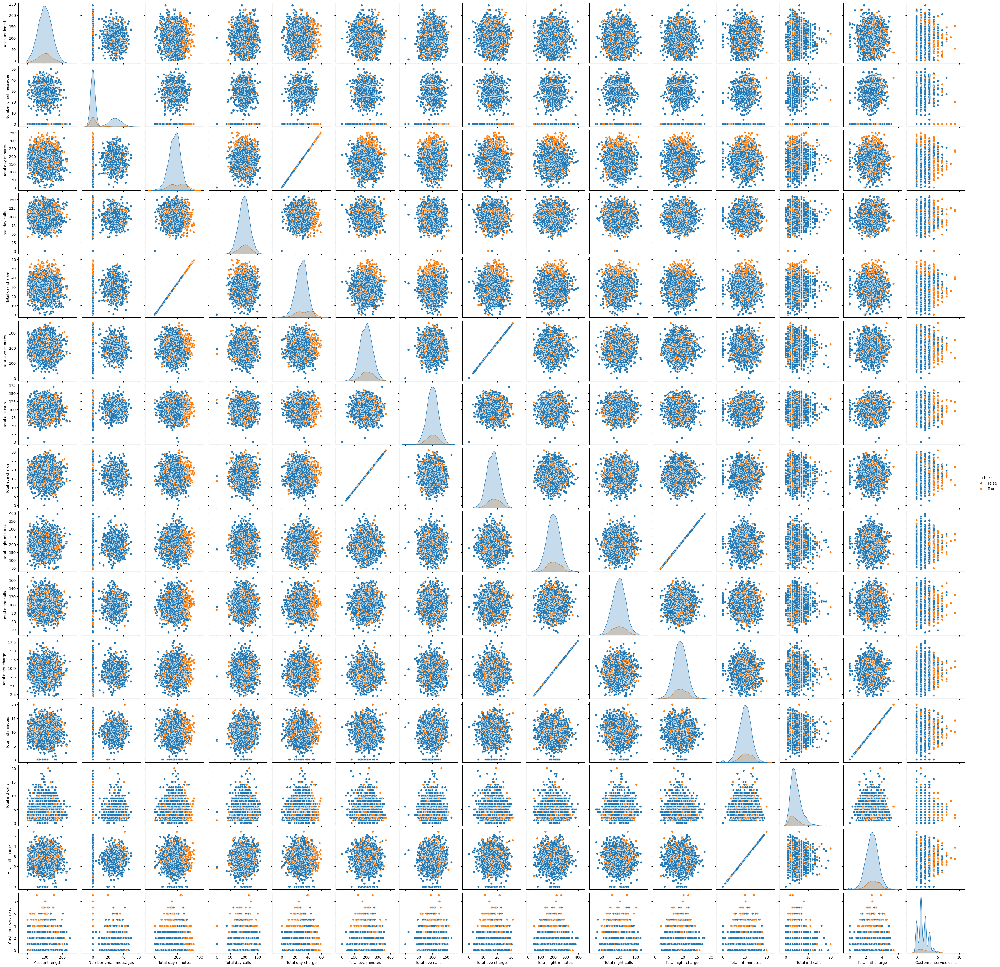

In [65]:
sns.pairplot(df, hue='Churn')

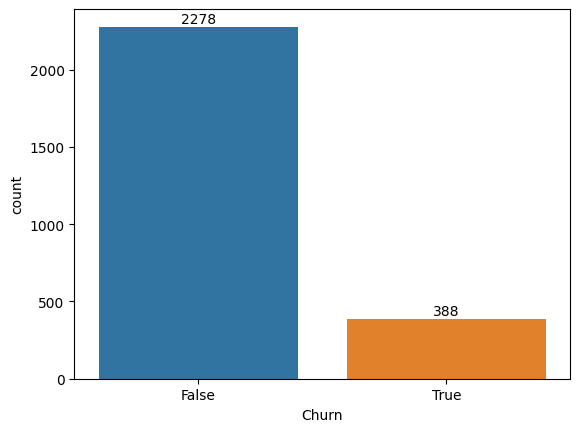

In [66]:
Churn_count = df['Churn'].value_counts()
ax = sns.countplot(data = df, x='Churn',palette='tab10',hue='Churn',legend=False)

for i in range(Churn_count.shape[0]):
    count = Churn_count.iloc[i]
    x = i 
    y = count+50
    ax.annotate(count,(x,y), ha = 'center',va = 'center')
    
plt.show()

<Axes: xlabel='Account length', ylabel='Count'>

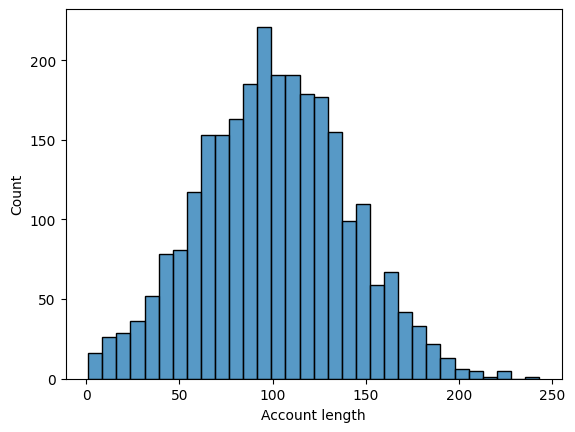

In [67]:
sns.histplot(data=df,x='Account length')

<h3> Top 5 States </h3>

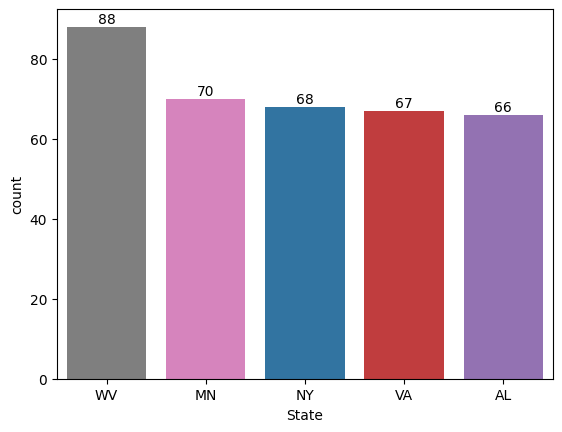

In [68]:
state_count = df['State'].value_counts()
ax = sns.countplot(data=df,x='State',palette='tab10',order=state_count.index[:5],hue='State')

for i in range(5):
    count = state_count.iloc[i]
    x = i 
    y = count+2
    ax.annotate(count,(x,y),ha="center",va="center")
    
plt.show()

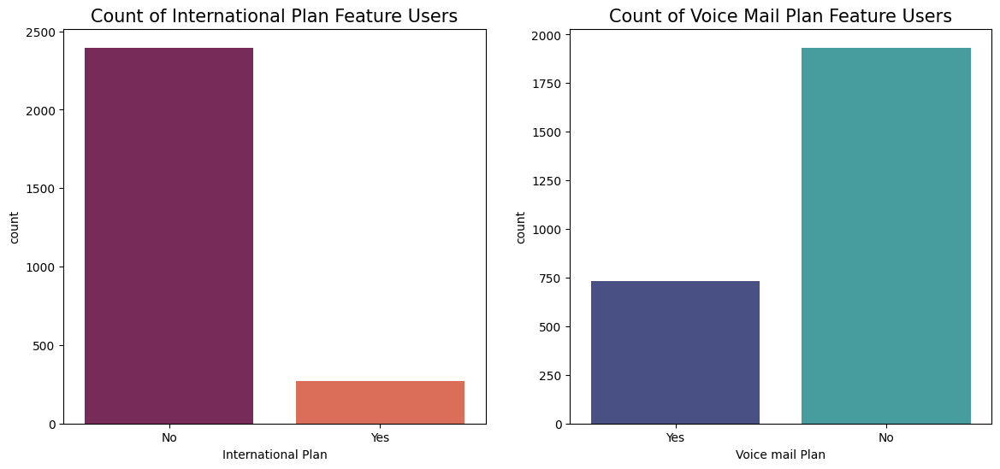

In [69]:
fig,axes = plt.subplots(1,2,figsize=(14,6))

sns.countplot(data=df,x="International plan",palette='rocket',hue='International plan',ax=axes[0],legend=False)
axes[0].set_title("Count of International Plan Feature Users",fontsize=15)
axes[0].set_xlabel('International Plan')

sns.countplot(data=df,x='Voice mail plan',palette='mako',hue = 'Voice mail plan',ax=axes[1],legend=False)
axes[1].set_title('Count of Voice Mail Plan Feature Users',fontsize=15)
axes[1].set_xlabel('Voice mail Plan')

plt.tight_layout
plt.show()

<h2>Feature Extraction </h2>

In [70]:
df.columns

Index(['State', 'Account length', 'International plan', 'Voice mail plan',
       'Number vmail messages', 'Total day minutes', 'Total day calls',
       'Total day charge', 'Total eve minutes', 'Total eve calls',
       'Total eve charge', 'Total night minutes', 'Total night calls',
       'Total night charge', 'Total intl minutes', 'Total intl calls',
       'Total intl charge', 'Customer service calls', 'Churn'],
      dtype='object')

In [71]:
df['Total charge']=df['Total day charge']+df['Total eve charge']+df['Total night charge']+df['Total intl charge']
df['Total minutes'] = df['Total day minutes']+df['Total eve minutes']+df['Total night minutes']+df['Total intl minutes']
df['Total call']= df['Total day calls']+df['Total eve calls']+df['Total night calls']+df['Total intl calls']

In [72]:
df.head()

,State,Account length,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,...,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn,Total charge,Total minutes,Total call
0,KS,128,No,Yes,25,265.1,110,45.07,197.4,99,...,91,11.01,10.0,3,2.70,1,False,75.56,717.2,303
1,OH,107,No,Yes,26,161.6,123,27.47,195.5,103,...,103,11.45,13.7,3,3.70,1,False,59.24,625.2,332
2,NJ,137,No,No,0,243.4,114,41.38,121.2,110,...,104,7.32,12.2,5,3.29,0,False,62.29,539.4,333
3,OH,84,Yes,No,0,299.4,71,50.90,61.9,88,...,89,8.86,6.6,7,1.78,2,False,66.80,564.8,255
4,OK,75,Yes,No,0,166.7,113,28.34,148.3,122,...,121,8.41,10.1,3,2.73,3,False,52.09,512.0,359


Total charge




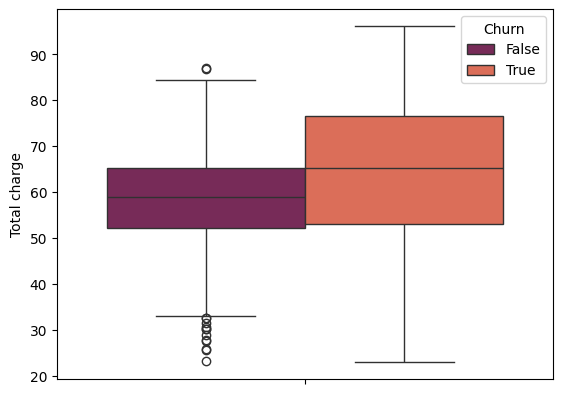



Total minutes




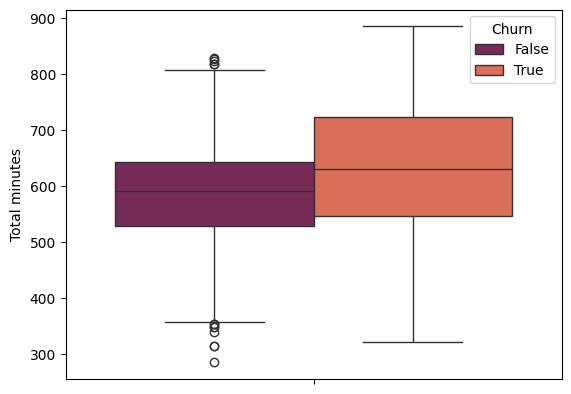



Total call




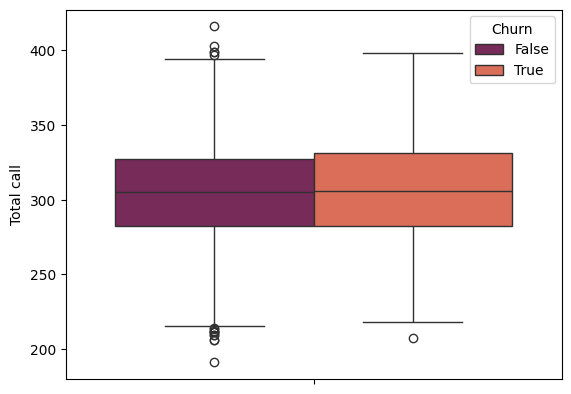

In [73]:
for col in df[['Total charge','Total minutes','Total call']]:
    print(f'{col}')
    print('\n')
    sns.boxplot(data=df,y=col,palette='rocket',hue='Churn')
    plt.show()
    print('\n')

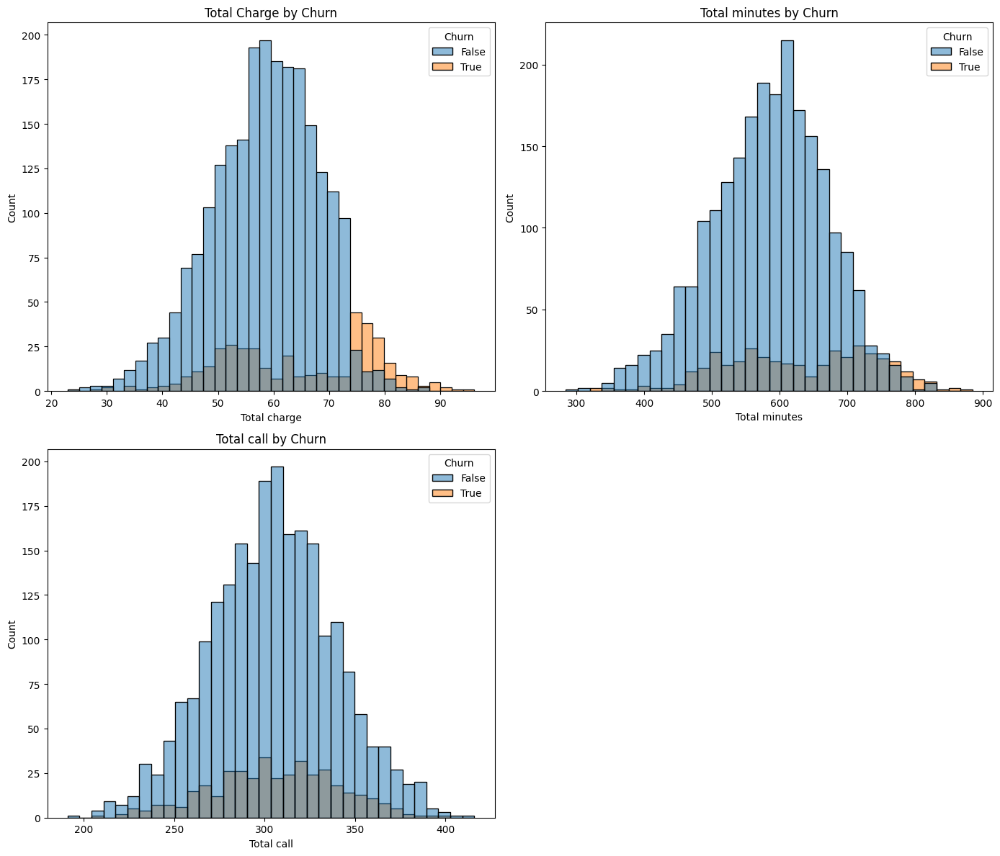

In [74]:
fig,axes = plt.subplots(2,2,figsize=(14,12))
sns.histplot(data=df,x='Total charge',hue='Churn',ax=axes[0,0])
axes[0,0].set_title('Total Charge by Churn')

sns.histplot(data=df,x="Total minutes",hue='Churn',ax=axes[0,1])
axes[0,1].set_title("Total minutes by Churn")

sns.histplot(data=df,x="Total call",hue='Churn',ax=axes[1,0])
axes[1,0].set_title("Total call by Churn")

fig.delaxes(axes[1,1])
plt.tight_layout()
plt.show()



In [75]:
df2= df[df['Total charge']>72]
df2['Churn'].value_counts()

Churn
True     164
False    141
Name: count, dtype: int64

In [76]:
df2 = df[df['Total charge']<72]
df2['Churn'].value_counts()

Churn
False    2136
True      224
Name: count, dtype: int64

Customers' daily charges exceed 72, their likelihood of churning increases.

(<module 'matplotlib.pyplot' from 'd:\\Churn Predicition\\archive\\env\\lib\\site-packages\\matplotlib\\pyplot.py'>,
 <Axes: xlabel='State', ylabel='count'>)

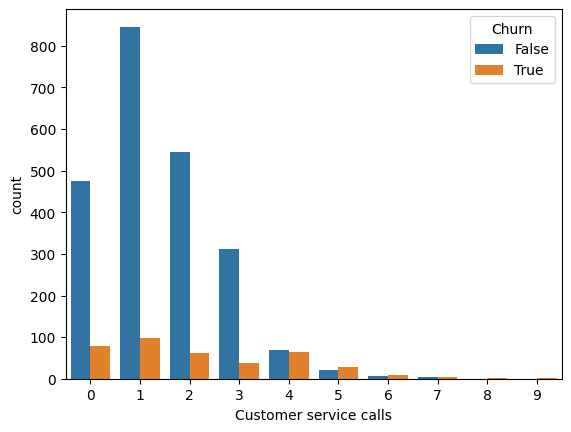

In [77]:
sns.countplot(data=df,x='Customer service calls',hue='Churn')
plt,ax

In [78]:
for i in range (8):
    value = df[df['Customer service calls']==i]['Churn'].value_counts()
    print(f'value for {i} Customer Service Calls ')
    print(value)
    print('_'*85)

value for 0 Customer Service Calls 
Churn
False    476
True      79
Name: count, dtype: int64
_____________________________________________________________________________________
value for 1 Customer Service Calls 
Churn
False    846
True      99
Name: count, dtype: int64
_____________________________________________________________________________________
value for 2 Customer Service Calls 
Churn
False    546
True      62
Name: count, dtype: int64
_____________________________________________________________________________________
value for 3 Customer Service Calls 
Churn
False    311
True      37
Name: count, dtype: int64
_____________________________________________________________________________________
value for 4 Customer Service Calls 
Churn
False    69
True     64
Name: count, dtype: int64
_____________________________________________________________________________________
value for 5 Customer Service Calls 
Churn
True     29
False    20
Name: count, dtype: int64
__________

When customers' service calls increase , their likelihood of churning increases.

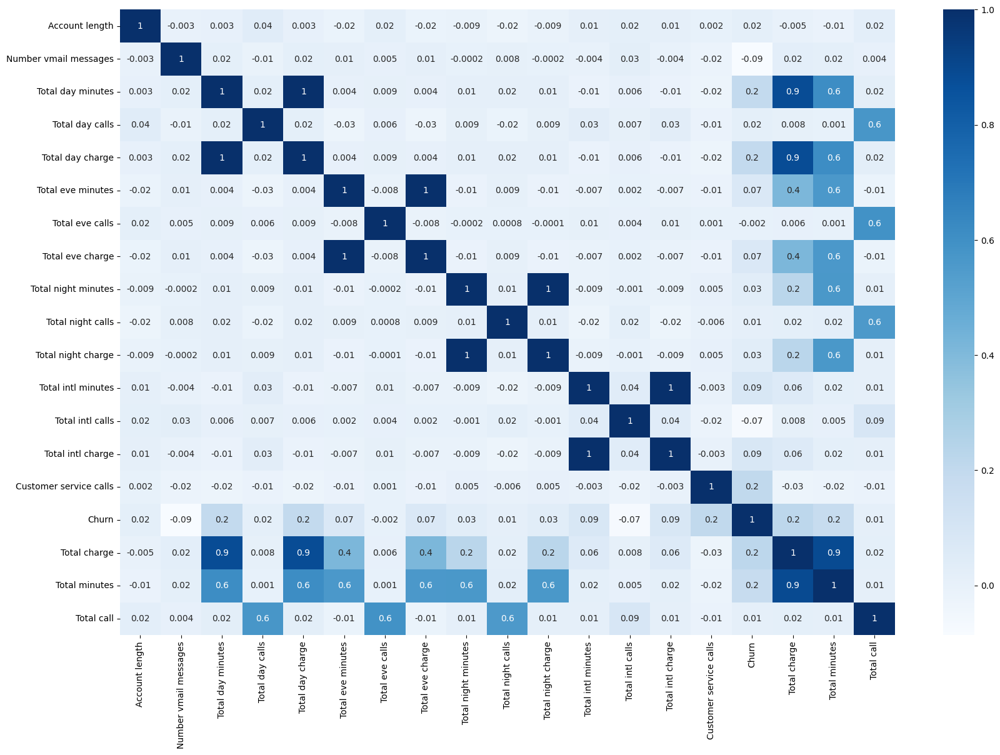

In [79]:
plt.figure(figsize=(20,13))
sns.heatmap(df.select_dtypes(exclude=['object']).corr(), cmap = 'Blues', annot = True, fmt= '.1g')

plt.show()

In [80]:
df.drop(['Total day minutes','Total day calls','Total day charge','Total eve minutes','Total eve calls','Total eve charge','Total night minutes','Total night charge','Total night calls','Total intl minutes','Total intl calls','Total intl charge'],axis=1,inplace=True)

In [81]:
#handling category columns 
df['International plan'] = df['International plan'].map({'No':0,'Yes':1})
df['Voice mail plan']= df['Voice mail plan'].map({'No':0,'Yes':1})


In [82]:
df.head()

,State,Account length,International plan,Voice mail plan,Number vmail messages,Customer service calls,Churn,Total charge,Total minutes,Total call
0,KS,128,0,1,25,1,False,75.56,717.2,303
1,OH,107,0,1,26,1,False,59.24,625.2,332
2,NJ,137,0,0,0,0,False,62.29,539.4,333
3,OH,84,1,0,0,2,False,66.80,564.8,255
4,OK,75,1,0,0,3,False,52.09,512.0,359


In [83]:
df['Churn'].value_counts()


Churn
False    2278
True      388
Name: count, dtype: int64

In [84]:
#handling Outliers
outlieres_indices = detect_outliers(df,0,df.select_dtypes(include=['float64','int64']))
percentage_outliers = 100 * (len(outlieres_indices) / df.shape[0])
print(f"Percentage of outliers: {percentage_outliers}%")


Percentage of outliers: 18.79219804951238%


In [85]:
df.drop(outlieres_indices, inplace=True)

In [86]:
df.head()


,State,Account length,International plan,Voice mail plan,Number vmail messages,Customer service calls,Churn,Total charge,Total minutes,Total call
0,KS,128,0,1,25,1,False,75.56,717.2,303
1,OH,107,0,1,26,1,False,59.24,625.2,332
2,NJ,137,0,0,0,0,False,62.29,539.4,333
6,MA,121,0,1,24,3,False,78.31,786.8,321
9,RI,74,0,0,0,0,False,57.08,556.2,374


In [87]:
df.drop(['State'], axis=1, inplace=True)

<h3>Splitting Data</h3>

In [88]:
x = df.drop('Churn', axis=1)
y = df['Churn']
smote = SMOTE()
x,y = smote.fit_resample(x,y)
x_train,x_test,y_train,y_test  = train_test_split(x,y,test_size=0.35,random_state=42,stratify=y,shuffle=True)
print('x_train shape --',x_train.shape)
print('y_train shape --',y_train.shape)
print('x_test shape --',x_test.shape)
print('y_test shape --',y_test.shape)



x_train shape -- (2601, 8)
y_train shape -- (2601,)
x_test shape -- (1401, 8)
y_test shape -- (1401,)


In [89]:
sc = StandardScaler()
x_train_final = sc.fit_transform(x_train)
x_test_final = sc.fit_transform(x_test)

In [90]:
y.value_counts()

Churn
False    2001
True     2001
Name: count, dtype: int64

<h2>Loading Models</h2> 

In [91]:
models = {
    'ovo': OneVsOneClassifier(estimator=RandomForestClassifier()),
    'knn': KNeighborsClassifier(),
    'SGD': SGDClassifier(),
    'Lgr':LogisticRegression(),
    'xgb': xgb.XGBClassifier(),
    'dt' : DecisionTreeClassifier(),
    'RF': RandomForestClassifier(),
    'bag':BaggingClassifier(),
    'gdb':GradientBoostingClassifier(),
    'SVC':SVC(),
    'baf_clf': BaggingClassifier(DecisionTreeClassifier(), n_estimators=500, max_samples=100, bootstrap=True)
    
}

For ovo Model: 
__________________________________________________________________________________________
CV Scores: [0.93857965 0.95192308 0.95       0.94807692 0.94807692]
Train Score is 1.0
Test Score is 0.9578872234118487
              precision    recall  f1-score   support

       False       0.93      0.99      0.96       701
        True       0.99      0.93      0.96       700

    accuracy                           0.96      1401
   macro avg       0.96      0.96      0.96      1401
weighted avg       0.96      0.96      0.96      1401



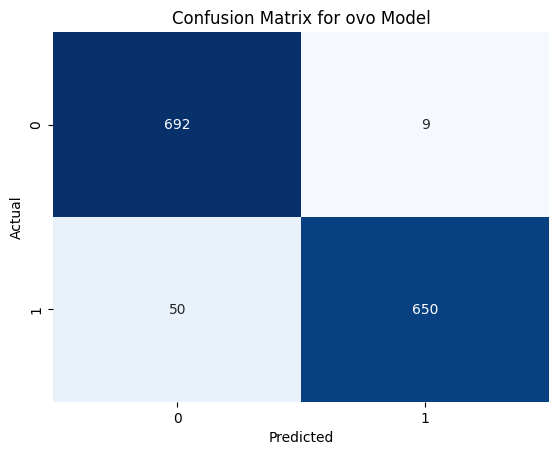

For knn Model: 
__________________________________________________________________________________________
CV Scores: [0.9059501  0.88653846 0.89230769 0.90192308 0.89423077]
Train Score is 0.9350249903883122
Test Score is 0.9079229122055674
              precision    recall  f1-score   support

       False       0.95      0.86      0.90       701
        True       0.87      0.96      0.91       700

    accuracy                           0.91      1401
   macro avg       0.91      0.91      0.91      1401
weighted avg       0.91      0.91      0.91      1401



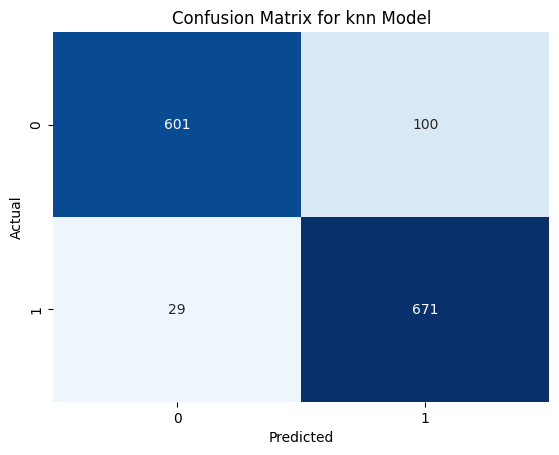

For SGD Model: 
__________________________________________________________________________________________
CV Scores: [0.82341651 0.84038462 0.81153846 0.85192308 0.80192308]
Train Score is 0.8389081122645137
Test Score is 0.8344039971448965
              precision    recall  f1-score   support

       False       0.82      0.86      0.84       701
        True       0.85      0.81      0.83       700

    accuracy                           0.83      1401
   macro avg       0.84      0.83      0.83      1401
weighted avg       0.84      0.83      0.83      1401



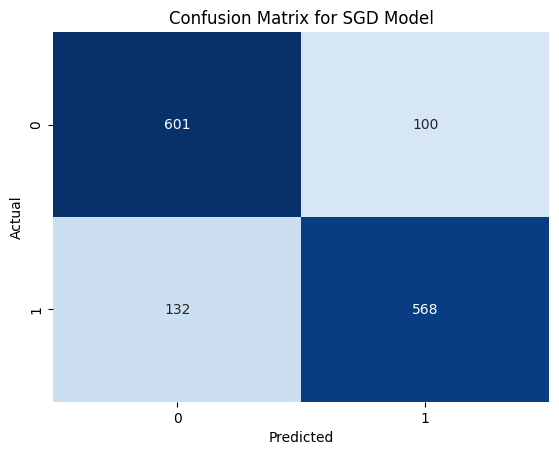

For Lgr Model: 
__________________________________________________________________________________________
CV Scores: [0.82725528 0.84423077 0.81346154 0.84807692 0.80961538]
Train Score is 0.8281430219146482
Test Score is 0.8451106352605282
              precision    recall  f1-score   support

       False       0.86      0.83      0.84       701
        True       0.83      0.86      0.85       700

    accuracy                           0.85      1401
   macro avg       0.85      0.85      0.85      1401
weighted avg       0.85      0.85      0.85      1401



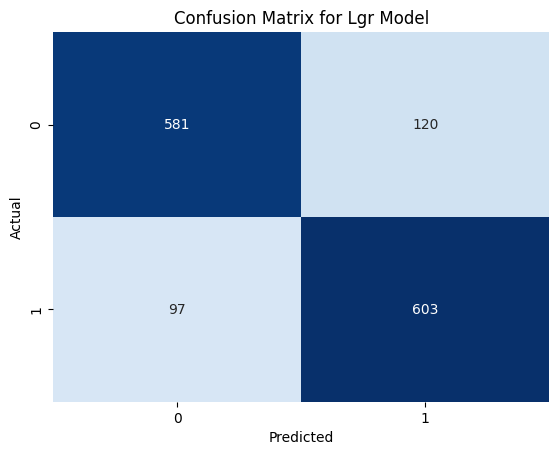

For xgb Model: 
__________________________________________________________________________________________
CV Scores: [0.93474088 0.95384615 0.95576923 0.93269231 0.95      ]
Train Score is 0.9996155324875048
Test Score is 0.9421841541755889
              precision    recall  f1-score   support

       False       0.95      0.94      0.94       701
        True       0.94      0.95      0.94       700

    accuracy                           0.94      1401
   macro avg       0.94      0.94      0.94      1401
weighted avg       0.94      0.94      0.94      1401



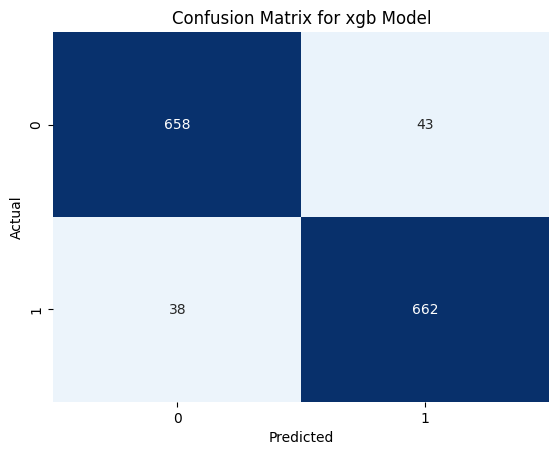

For dt Model: 
__________________________________________________________________________________________
CV Scores: [0.89827255 0.90769231 0.91538462 0.9        0.91346154]
Train Score is 1.0
Test Score is 0.9014989293361885
              precision    recall  f1-score   support

       False       0.90      0.90      0.90       701
        True       0.90      0.90      0.90       700

    accuracy                           0.90      1401
   macro avg       0.90      0.90      0.90      1401
weighted avg       0.90      0.90      0.90      1401



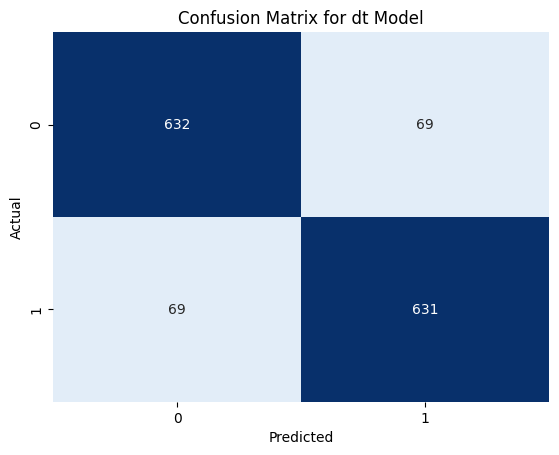

For RF Model: 
__________________________________________________________________________________________
CV Scores: [0.93666027 0.95       0.94807692 0.95192308 0.94423077]
Train Score is 1.0
Test Score is 0.9493219129193433
              precision    recall  f1-score   support

       False       0.92      0.98      0.95       701
        True       0.98      0.92      0.95       700

    accuracy                           0.95      1401
   macro avg       0.95      0.95      0.95      1401
weighted avg       0.95      0.95      0.95      1401



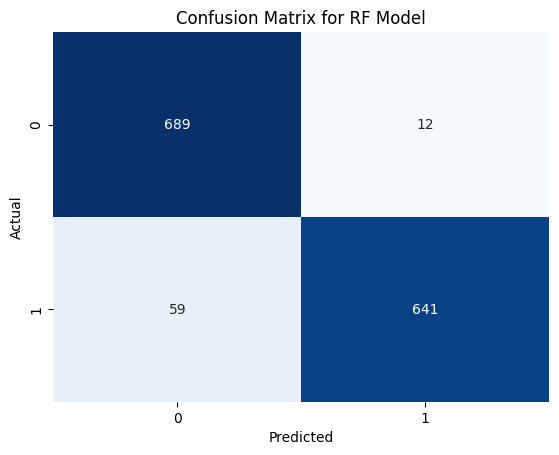

For bag Model: 
__________________________________________________________________________________________
CV Scores: [0.92130518 0.93076923 0.92115385 0.94230769 0.94038462]
Train Score is 0.9953863898500577
Test Score is 0.940756602426838
              precision    recall  f1-score   support

       False       0.92      0.97      0.94       701
        True       0.97      0.91      0.94       700

    accuracy                           0.94      1401
   macro avg       0.94      0.94      0.94      1401
weighted avg       0.94      0.94      0.94      1401



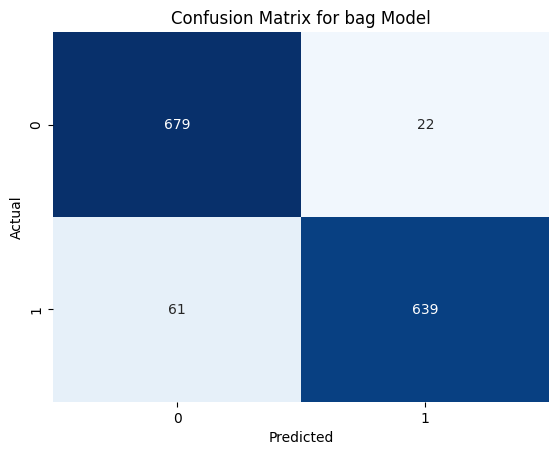

For gdb Model: 
__________________________________________________________________________________________
CV Scores: [0.89827255 0.90961538 0.92115385 0.90961538 0.88269231]
Train Score is 0.9292579777008843
Test Score is 0.9064953604568166
              precision    recall  f1-score   support

       False       0.87      0.96      0.91       701
        True       0.96      0.85      0.90       700

    accuracy                           0.91      1401
   macro avg       0.91      0.91      0.91      1401
weighted avg       0.91      0.91      0.91      1401



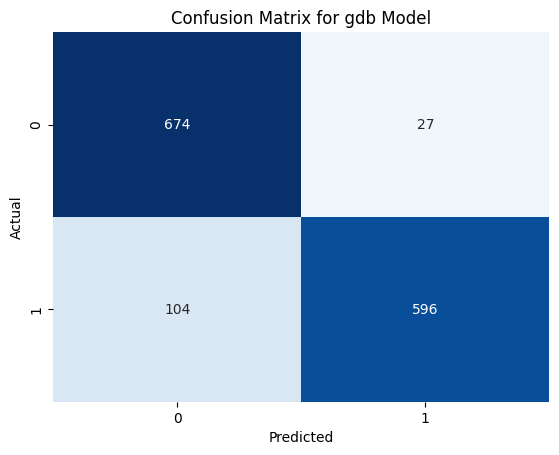

For SVC Model: 
__________________________________________________________________________________________
CV Scores: [0.88675624 0.87115385 0.85769231 0.88846154 0.85192308]
Train Score is 0.8788927335640139
Test Score is 0.8822269807280514
              precision    recall  f1-score   support

       False       0.84      0.95      0.89       701
        True       0.94      0.82      0.87       700

    accuracy                           0.88      1401
   macro avg       0.89      0.88      0.88      1401
weighted avg       0.89      0.88      0.88      1401



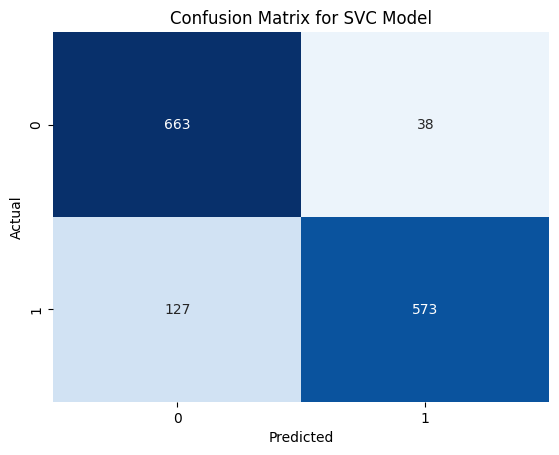

For baf_clf Model: 
__________________________________________________________________________________________
CV Scores: [0.85604607 0.88846154 0.86538462 0.89230769 0.84807692]
Train Score is 0.8804306036139946
Test Score is 0.8793718772305497
              precision    recall  f1-score   support

       False       0.82      0.98      0.89       701
        True       0.97      0.78      0.87       700

    accuracy                           0.88      1401
   macro avg       0.89      0.88      0.88      1401
weighted avg       0.89      0.88      0.88      1401



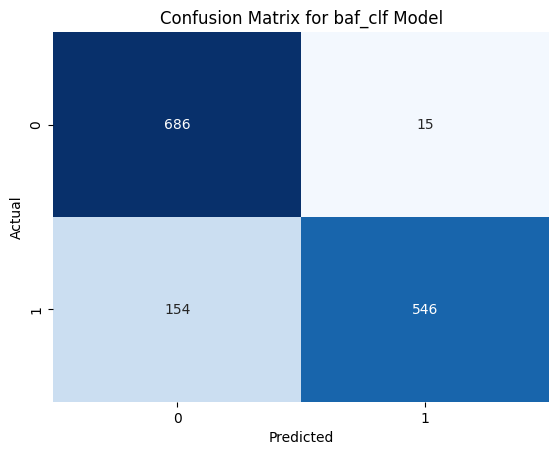

In [92]:
for key, model in models.items():
    print(f'For {key} Model: ')
    print('_'*90)
    
    cv_scores = cross_val_score(model,x_train_final,y_train,cv=5,scoring='accuracy')
    print(f"CV Scores: {cv_scores}")
    
    model.fit(x_train_final, y_train)
    
    y_pred = model.predict(x_test_final)
    
    train_accuracy = accuracy_score(y_train,model.predict(x_train_final))
    test_accuracy = accuracy_score(y_test, y_pred)
    print(f"Train Score is {train_accuracy}")
    print(f"Test Score is {test_accuracy}")
    print(classification_report(y_test,y_pred))
    
    confusion_mat = confusion_matrix(y_test, y_pred)
    sns.heatmap(confusion_mat, fmt='g',annot = True, cbar = False,vmin=0,cmap='Blues')
    plt.title(f'Confusion Matrix for {key} Model')
    plt.xlabel('Predicted')
    plt.ylabel("Actual")
    plt.show()
    
    

Voting Classifier 

In [93]:
voting_clsf = VotingClassifier(
    estimators = [
        ('bag', BaggingClassifier()),
        ('gdb', GradientBoostingClassifier()),
        ('knn', KNeighborsClassifier())
    ],
    voting ='hard'
)
cv_scores = cross_val_score(voting_clsf, x_train_final,y_train,cv=5,scoring='accuracy')

print("CV Scores: ",cv_scores)
print("Mean CV Score: ", cv_scores.mean())

voting_clsf.fit(x_train_final, y_train)

y_pred = voting_clsf.predict(x_test_final)

train_accuracy = accuracy_score(y_train, voting_clsf.predict(x_train_final))
test_accuracy = accuracy_score(y_test, y_pred)

print("Training Accuracy: ", train_accuracy)
print("Test Accuracy: ",test_accuracy)
print(classification_report(y_test, y_pred))

CV Scores:  [0.92898273 0.92692308 0.94807692 0.93846154 0.92692308]
Mean CV Score:  0.9338734681824894
Training Accuracy:  0.9819300269127259
Test Accuracy:  0.9364739471805853
              precision    recall  f1-score   support

       False       0.92      0.95      0.94       701
        True       0.95      0.92      0.94       700

    accuracy                           0.94      1401
   macro avg       0.94      0.94      0.94      1401
weighted avg       0.94      0.94      0.94      1401



In [94]:
# Training - Test (To check overfitting/underfitting)
(0.981-0.947)*100 # <5% so no overfitting 

3.400000000000003

In [95]:
input_shape = x_train_final.shape[1]
input_shape

8

In [113]:
model = Sequential()
model.add(Dense(265, input_shape=(input_shape,), activation='tanh'))
model.add(Dropout(0.2))

model.add(Dense(128, activation='tanh'))
model.add(Dropout(0.4))

model.add(Dense(128, activation='tanh'))
model.add(Dropout(0.5))

model.add(Dense(64, activation='tanh'))
model.add(Dropout(0.3))

model.add(Dense(64, activation='tanh'))
model.add(Dropout(0.1))

model.add(Dense(64, activation='tanh'))
model.add(Dropout(0.2))

model.add(Dense(64, activation='tanh'))
model.add(Dropout(0.1))

model.add(Dense(1, activation='sigmoid'))

model.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

early_stopping = EarlyStopping(monitor='val_accuracy',patience=1200,restore_best_weights = True)

model.summary()




Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_20 (Dense)                │ (None, 265)            │         2,385 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_14 (Dropout)            │ (None, 265)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 128)            │        34,048 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_15 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_16 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_17 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_24 (Dense)                │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_18 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_19 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_20 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_27 (Dense)                │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 73,746 (288.07 KB)

 Trainable params: 73,746 (288.07 KB)

 Non-trainable params: 0 (0.00 B)

In [124]:
history = model.fit(x=x_train_final,y=y_train, validation_data=(x_test_final, y_test), validation_split=0.1, batch_size=512,epochs=600,verbose=1, callbacks=[early_stopping])

Epoch 1/600
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.9200 - loss: 0.1839 - val_accuracy: 0.9343 - val_loss: 0.1764
Epoch 2/600
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.9317 - loss: 0.1634 - val_accuracy: 0.9329 - val_loss: 0.1803
Epoch 3/600
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.9319 - loss: 0.1668 - val_accuracy: 0.9350 - val_loss: 0.1824
Epoch 4/600
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.9193 - loss: 0.1825 - val_accuracy: 0.9358 - val_loss: 0.1748
Epoch 5/600
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.9257 - loss: 0.1737 - val_accuracy: 0.9293 - val_loss: 0.1767
Epoch 6/600
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.9210 - loss: 0.1883 - val_accuracy: 0.9350 - val_loss: 0.1749
Epoch 7/600
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.9189 - loss: 0.1757 - val_accuracy: 0.9343 - val_loss: 0.1739
Epoch 8/600
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.9291 - loss: 0.1662 - val_accuracy: 0.9329 - val_loss: 0.1

In [127]:
model.evaluate(x_test_final, y_test)

44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - accuracy: 0.9486 - loss: 0.1474


[0.15615591406822205, 0.9478943347930908]

In [128]:
model.evaluate(x_train_final, y_train)

82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 729us/step - accuracy: 0.9580 - loss: 0.0988


[0.10341949760913849, 0.9542483687400818]